# Close look at thickness profile
Here I take a look at the thickness profile. Essentially some downstream lines have a high at melt bullseye, others have low. This is caused by the interpolation, lines downstream with a ledge form more incision those off the ledge a thick spot.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
import sys
import time
import datetime as dt
import pandas as pd
import geopandas as gpd
from tqdm.notebook import tqdm
import rasterio as rio
from shapely.geometry import Point, LineString, Polygon, MultiPoint
import fiona
from shapely.ops import nearest_points

In [2]:
new_gpr = gpd.read_file('/Volumes/arc_04/FIELD_DATA/K8621920/RES/PROCESSED_LINES/picked_bed.shp')
old_gpr = gpd.read_file('/Volumes/arc_04/FIELD_DATA/K8621920/RES/PROCESSED_LINES/1516_gprlines.shp')
old_gpr['camp'] = 'KIS2' 
bed_gdf = pd.concat([new_gpr,old_gpr])
gdf = bed_gdf[bed_gdf.camp =='KIS2'].copy()
ngpr = new_gpr[new_gpr.camp =='KIS2'].copy()

In [3]:
x_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_points_x.npy')
y_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_points_y.npy')
it_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_ice_thickn.npy')


In [4]:
x_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_points_x.npy')
y_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_points_y.npy')
it_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_ice_thickn.npy')
ib_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_icebase.npy')

In [5]:
#load REMA
nid1 = 159202
nid2 = 131226
df = gpd.read_file('/Users/home/whitefar/DATA/REMOTE_SENSING/REMA_2m_strips/REMA_Strip_Index_Rel1.shp')
path = f"/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/DIFFERENCES/REMA_{nid1}-{nid2}_diff.tif"
f = df.loc[nid1].acquisitio
t =df.loc[nid2].acquisitio
duration = (pd.to_datetime(t)-pd.to_datetime(f)).days/365.25
with rio.open(path) as image:
    im = image.read(1)
    im[im==-9999] = np.nan
    im = im / duration
    extent_REMAdiff = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
with rio.open('/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/SETSM_WV01_20161109_1020010058134D00_10200100576C9100_seg1_2m_v1.0_dem.tif') as image:
    extent_REMA = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
    im_REMA = image.read(1)/100

In [6]:
df.loc[nid1].fileurl

'http://data.pgc.umn.edu/elev/dem/setsm/REMA/geocell/v1.0/2m/s83w153/SETSM_WV02_20121224_103001001D86CA00_103001001D886000_seg1_2m_v1.0.tar.gz'

In [7]:
direc = '/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/interpolatedgrid_allchan'

xv = np.load(direc + 'x_grid' +'.npy')
yv = np.load(direc + 'y_grid' +'.npy')
thickness_interpolated = np.load(direc +'ice_thickness'+'.npy')
extent_l2l = np.load(direc +'extent.npy')
ice_base = np.load(direc +'_ice_base.npy')


In [8]:
x = np.linspace(extent_REMA[0],extent_REMA[1],im_REMA.shape[1]).astype('int')
y = np.linspace(extent_REMA[3],extent_REMA[2],im_REMA.shape[0]).astype('int')

In [9]:
xmin, xmax, ymin, ymax = extent_l2l

In [10]:
x_i = np.argwhere((x>xmin) & (x< xmax)).flatten()[0]
x_j = np.argwhere((x>xmin) & (x< xmax)).flatten()[-1]
y_i = np.argwhere((y>ymin) & (y< ymax)).flatten()[0]
y_j = np.argwhere((y>ymin) & (y< ymax)).flatten()[-1]

In [11]:
x_c = np.linspace(extent_REMA[0],extent_REMA[1],im_REMA.shape[1]).astype('int')[x_i:x_j]
y_c = np.linspace(extent_REMA[3],extent_REMA[2],im_REMA.shape[0]).astype('int')[y_i:y_j]

In [12]:
xv_REMA, yv_REMA = np.meshgrid(x_c, y_c)

In [13]:
im_REMA_d = im_REMA[y_i:y_j,x_i:x_j]
im_REMA_d[im_REMA_d==-99.99] = np.nan
im_REMA_c = im_REMA_d*100
del im_REMA_d

## 3. thickness over length

In [14]:
it = it_new[10,:]
ib = ib_new[10,:]
x = x_new[10,:]
y = y_new[10,:]
mid = pd.DataFrame({'x': x,'y':y,'ice_thickn':it,'ice_base':ib})

points = [Point(xy) for xy in zip(mid.x,mid.y)]
gdf_mid = gpd.GeoDataFrame(mid,geometry=points,crs="EPSG:3031")

In [15]:
points_x_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel.npy')
points_y_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel.npy') 
ice_thickn_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/ice_thickn_channel.npy')
base_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/bed_channel.npy')

In [16]:
ib_new.shape

(20, 331)

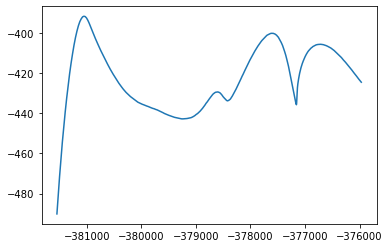

In [17]:
plt.plot(x,np.mean(ib_new[5:15,:],0))

/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


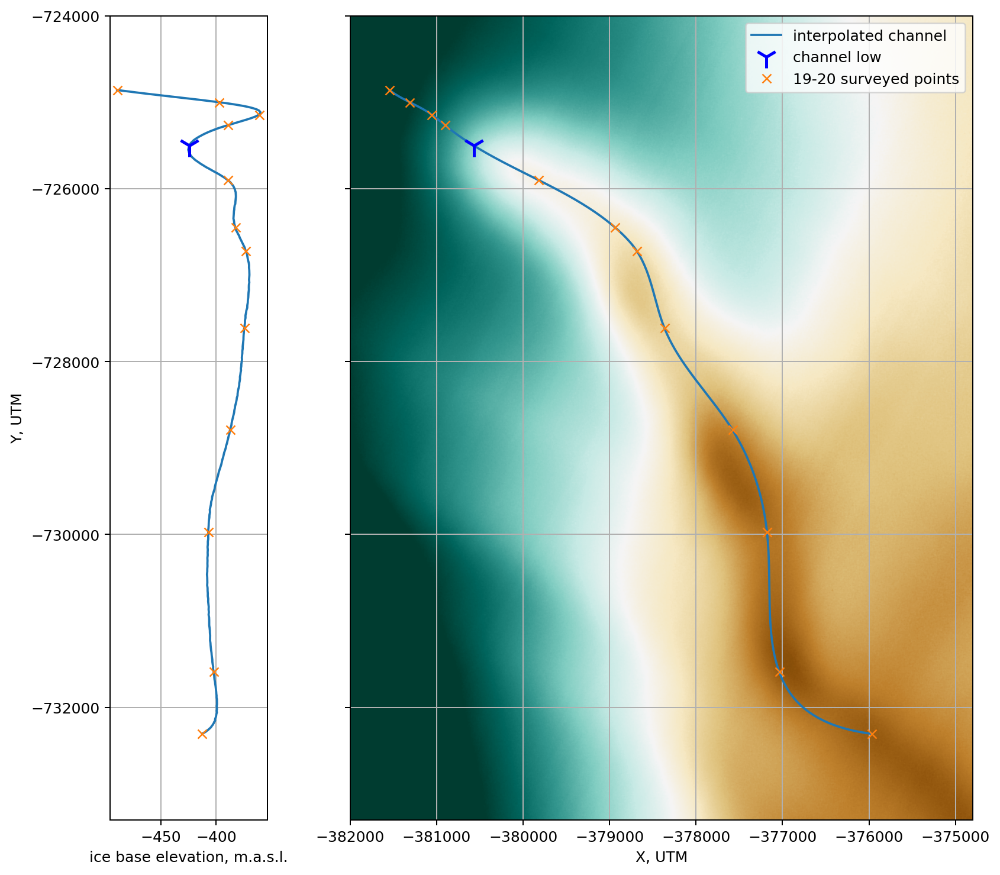

In [18]:
# %matplotlib qt
#  fug, (a0, a1) = plt.subplots(2,1, gridspec_kw = {'height_ratios':[2, 3]},figsize=(6,6),dpi=180)#rema

fig, (ax1, ax2) = plt.subplots(1,2, sharey='row',gridspec_kw = {'width_ratios':[1, 4]},
                               figsize=(10.5,10),dpi=180)#rema ,constrained_layout=True

ax2.imshow(im_REMA,extent=extent_REMA,vmin=0.2,vmax=0.7, cmap='BrBG')
ax2.plot( gdf_mid.x,gdf_mid.y,label='interpolated channel')
ax2.plot( gdf_mid.x.iloc[39],gdf_mid.y.iloc[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
ax2.plot(points_x_surveyed[10,:],points_y_surveyed[10,:],'x',label="19-20 surveyed points")
ax2.set_xlim([-382000, -374800])
ax2.set_ylim([-733300,-724000])
ax2.grid()
ax2.set_xlabel('X, UTM')
ax2.legend()
# plt.contour(xv,yv,surf_out-thickness_interpolated,linewidths=0.75)


ax1.plot(gdf_mid.ice_base,gdf_mid.y)
ax1.plot(base_surveyed[10,:],points_y_surveyed[10,:],'x',label="19-20 surveyed points")
ax1.plot( gdf_mid.ice_base.iloc[39],gdf_mid.y.iloc[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
# ax1.set_xlim([400, 480])
ax1.set_ylim([-733300,-724000])
ax1.set_ylabel('Y, UTM')
ax1.set_xlabel('ice base elevation, m.a.s.l.')

ax1.grid()
fig.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/base_surfacecolour.png')
fig.show()



/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:32: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


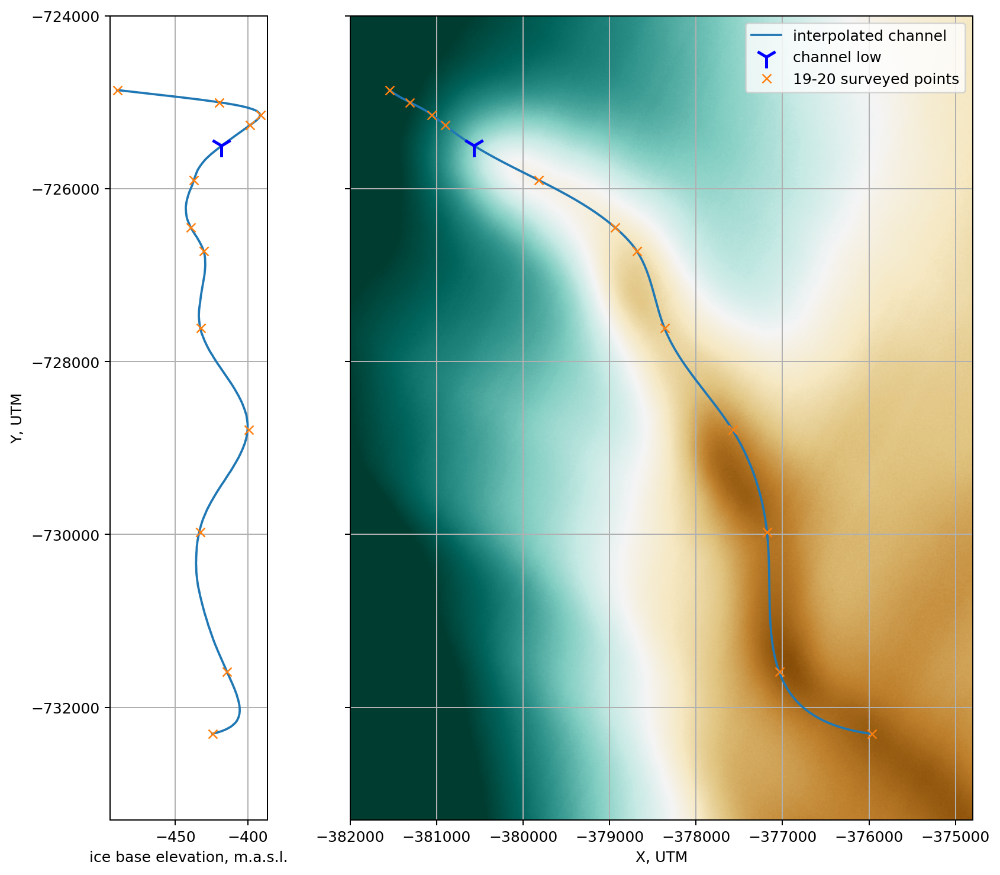

In [19]:
# Not all interpolated lines downstream are consistent laterally so i take an average to try and get a rough depth

# %matplotlib qt
#  fug, (a0, a1) = plt.subplots(2,1, gridspec_kw = {'height_ratios':[2, 3]},figsize=(6,6),dpi=180)#rema

fig, (ax1, ax2) = plt.subplots(1,2, sharey='row',gridspec_kw = {'width_ratios':[1, 4]},
                               figsize=(10.5,10),dpi=180)#rema ,constrained_layout=True

ax2.imshow(im_REMA,extent=extent_REMA,vmin=0.2,vmax=0.7, cmap='BrBG')
ax2.plot( gdf_mid.x,gdf_mid.y,label='interpolated channel')
ax2.plot( gdf_mid.x.iloc[39],gdf_mid.y.iloc[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
ax2.plot(points_x_surveyed[10,:],points_y_surveyed[10,:],'x',label="19-20 surveyed points")
ax2.set_xlim([-382000, -374800])
ax2.set_ylim([-733300,-724000])
ax2.grid()
ax2.set_xlabel('X, UTM')
ax2.legend()
# plt.contour(xv,yv,surf_out-thickness_interpolated,linewidths=0.75)

f = 5
t = 15
ax1.plot(np.mean(ib_new[f:t,:],0),gdf_mid.y)
ax1.plot(np.mean(base_surveyed[f:t,:],0),points_y_surveyed[10,:],'x',label="19-20 surveyed points")
ax1.plot( np.mean(ib_new[f:t,39]),gdf_mid.y.iloc[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
# ax1.set_xlim([400, 480])
ax1.set_ylim([-733300,-724000])
ax1.set_ylabel('Y, UTM')
ax1.set_xlabel('ice base elevation, m.a.s.l.')

ax1.grid()
fig.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/base_surfacecolour.png')
fig.show()



In [16]:
deepest_ib_index = np.argmax(ib_new,0)
deepest_ib_surveyed = np.argmax(base_surveyed,0)

ib_deepest = np.array([ib_new[deepest_ib_index[i],i] for i in range(ib_new.shape[1]) ])
x_deepest = np.array([x_new[deepest_ib_index[i],i] for i in range(ib_new.shape[1]) ])
y_deepest = np.array([y_new[deepest_ib_index[i],i] for i in range(ib_new.shape[1]) ])
points_x_surveyed_deepest = np.array([points_x_surveyed[deepest_ib_surveyed[i],i] for i in range(base_surveyed.shape[1]) ])
points_y_surveyed_deepest = np.array([points_y_surveyed[deepest_ib_surveyed[i],i] for i in range(base_surveyed.shape[1]) ])
base_surveyed_deepest = np.array([base_surveyed[deepest_ib_surveyed[i],i] for i in range(base_surveyed.shape[1]) ])

In [21]:
deepest_ib_index[39]

13

/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


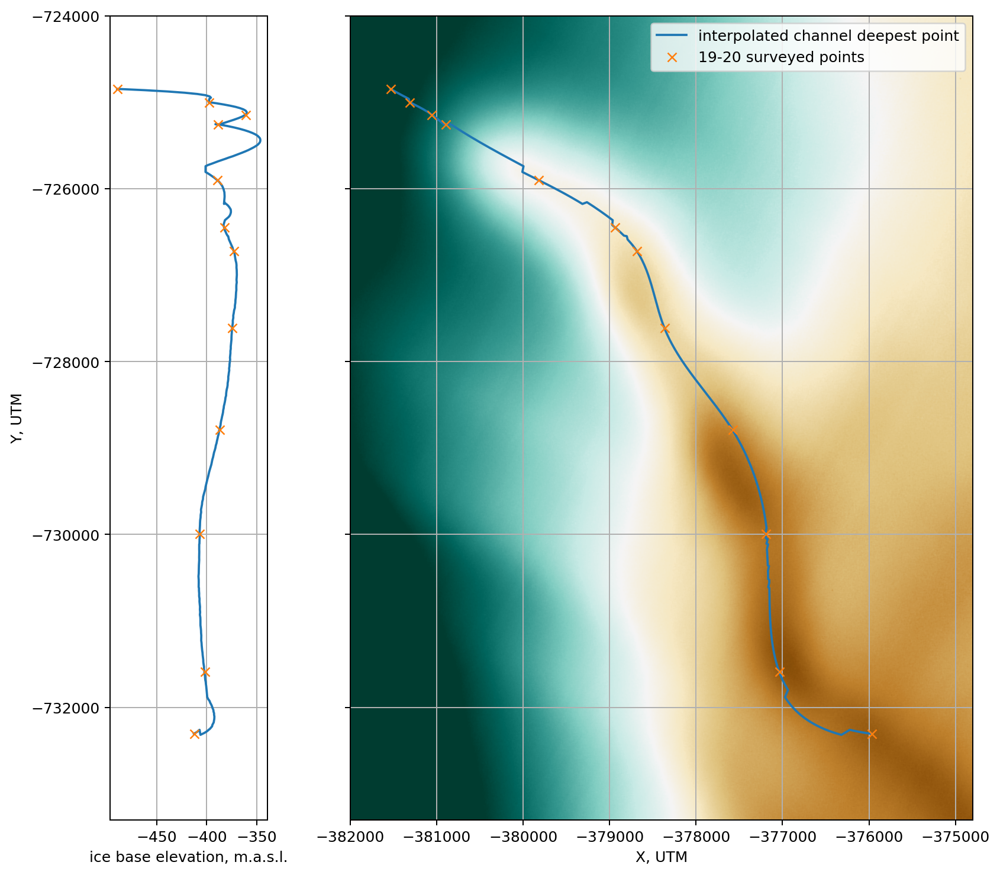

In [18]:
# Not all interpolated lines downstream are consistent laterally so i take an maximum base height. This doesnt work so well.

# %matplotlib qt
#  fug, (a0, a1) = plt.subplots(2,1, gridspec_kw = {'height_ratios':[2, 3]},figsize=(6,6),dpi=180)#rema

fig, (ax1, ax2) = plt.subplots(1,2, sharey='row',gridspec_kw = {'width_ratios':[1, 4]},
                               figsize=(10.5,10),dpi=180)#rema ,constrained_layout=True

ax2.imshow(im_REMA,extent=extent_REMA,vmin=0.2,vmax=0.7, cmap='BrBG')
ax2.plot( x_deepest,y_deepest,label='interpolated channel deepest point')
# ax2.plot( x_deepest[39],y_deepest[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
ax2.plot(points_x_surveyed_deepest,points_y_surveyed_deepest,'x',label="19-20 surveyed points")
ax2.set_xlim([-382000, -374800])
ax2.set_ylim([-733300,-724000])
ax2.grid()
ax2.set_xlabel('X, UTM')
ax2.legend()
# plt.contour(xv,yv,surf_out-thickness_interpolated,linewidths=0.75)

ax1.plot(ib_deepest,y_deepest)
ax1.plot(base_surveyed_deepest,points_y_surveyed_deepest,'x',label="19-20 surveyed points")
# ax1.plot( np.max(ib_new[:,39]),gdf_mid.y.iloc[39],'b1',label="channel low",markersize=15,markeredgewidth=2)
# ax1.set_xlim([400, 480])
ax1.set_ylim([-733300,-724000])
ax1.set_ylabel('Y, UTM')
ax1.set_xlabel('ice base elevation, m.a.s.l.')

ax1.grid()
# fig.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/base_surfacecolour.png')
fig.show()



/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


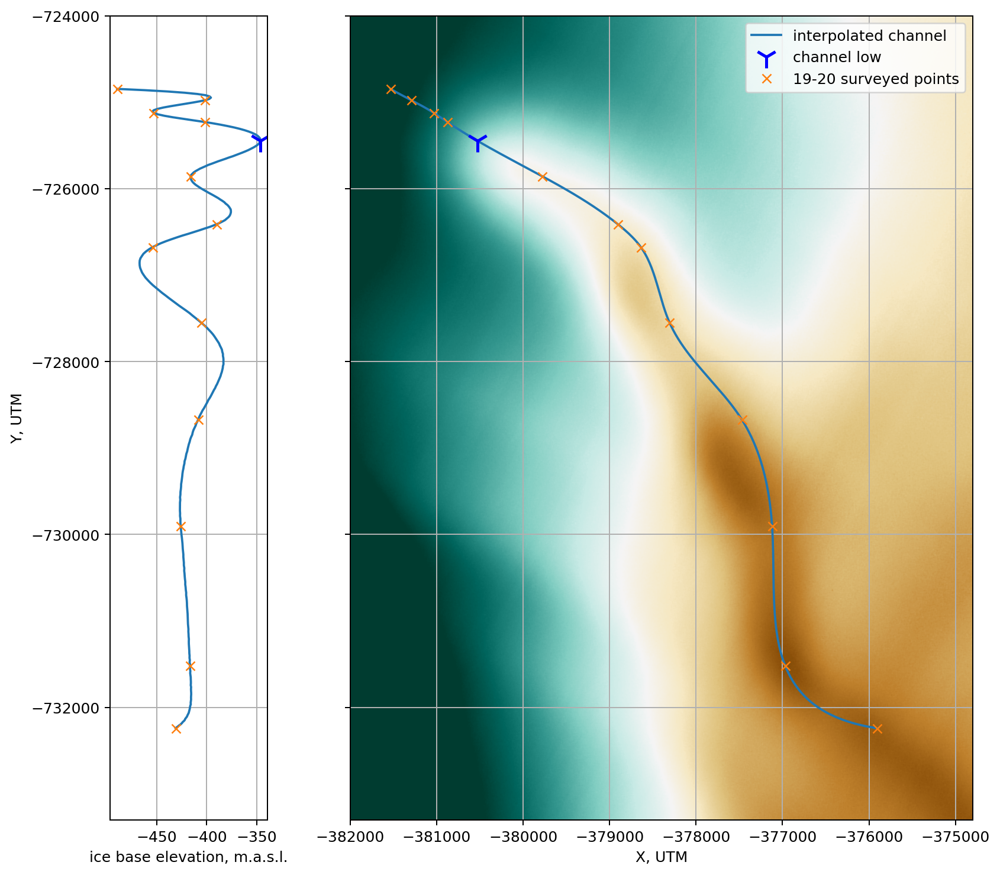

In [23]:
# %matplotlib qt
#  fug, (a0, a1) = plt.subplots(2,1, gridspec_kw = {'height_ratios':[2, 3]},figsize=(6,6),dpi=180)#rema

mid_at = 13

fig, (ax1, ax2) = plt.subplots(1,2, sharey='row',gridspec_kw = {'width_ratios':[1, 4]},
                               figsize=(10.5,10),dpi=180)#rema ,constrained_layout=True

ax2.imshow(im_REMA,extent=extent_REMA,vmin=0.2,vmax=0.7, cmap='BrBG')
ax2.plot(x_new[mid_at,:],y_new[mid_at,:],label='interpolated channel')
ax2.plot( x_new[mid_at,39],y_new[mid_at,39],'b1',label="channel low",markersize=15,markeredgewidth=2)
ax2.plot(points_x_surveyed[mid_at,:],points_y_surveyed[mid_at,:],'x',label="19-20 surveyed points")
ax2.set_xlim([-382000, -374800])
ax2.set_ylim([-733300,-724000])
ax2.grid()
ax2.set_xlabel('X, UTM')
ax2.legend()
# plt.contour(xv,yv,surf_out-thickness_interpolated,linewidths=0.75)


ax1.plot(ib_new[mid_at,:],y_new[mid_at,:])
ax1.plot(base_surveyed[mid_at,:],points_y_surveyed[mid_at,:],'x',label="19-20 surveyed points")
ax1.plot( ib_new[mid_at,39],y_new[mid_at,39],'b1',label="channel low",markersize=15,markeredgewidth=2)
# ax1.set_xlim([400, 480])
ax1.set_ylim([-733300,-724000])
ax1.set_ylabel('Y, UTM')
ax1.set_xlabel('ice base elevation, m.a.s.l.')

ax1.grid()
fig.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/base_surfacecolour.png')
fig.show()



essentially line 7p25 can go either way relative to 7p5. If its on the ledge it gets deeper (shown in 26_RADAR... in channel profiles), if its not on the ledge it gets shallower

In [24]:
base_surveyed

array([[-675.7820983 , -671.33766871, -667.86628815, -665.00041045,
        -660.67786605, -650.35900449, -650.5717899 , -627.0466359 ,
        -573.85200035, -557.85443376, -528.35164016, -540.62080727],
       [-494.01639453, -619.75890306, -613.61833395, -617.36239696,
        -580.90573775, -611.45405996, -492.76291396, -598.79166232,
        -503.87298092, -541.95381557, -495.73565748, -511.57516522],
       [-493.61739071, -563.95277099, -565.95322101, -577.13790669,
        -504.67255286, -598.84196878, -496.7523078 , -591.25913567,
        -498.54554021, -519.35881134, -439.38916424, -484.12627449],
       [-492.68286651, -511.54070305, -512.06430755, -529.08215281,
        -476.02784117, -587.40819726, -491.34196631, -580.80665622,
        -412.59868331, -495.6092576 , -433.59609369, -456.51913749],
       [-491.92356212, -460.92681785, -457.15002943, -487.97299951,
        -473.07208542, -577.29838827, -485.39379565, -579.9677559 ,
        -410.45750231, -476.76651614, -430.1

/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
/Users/home/whitefar/miniconda3/envs/remote_sensing/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
/Users/home/whitefar

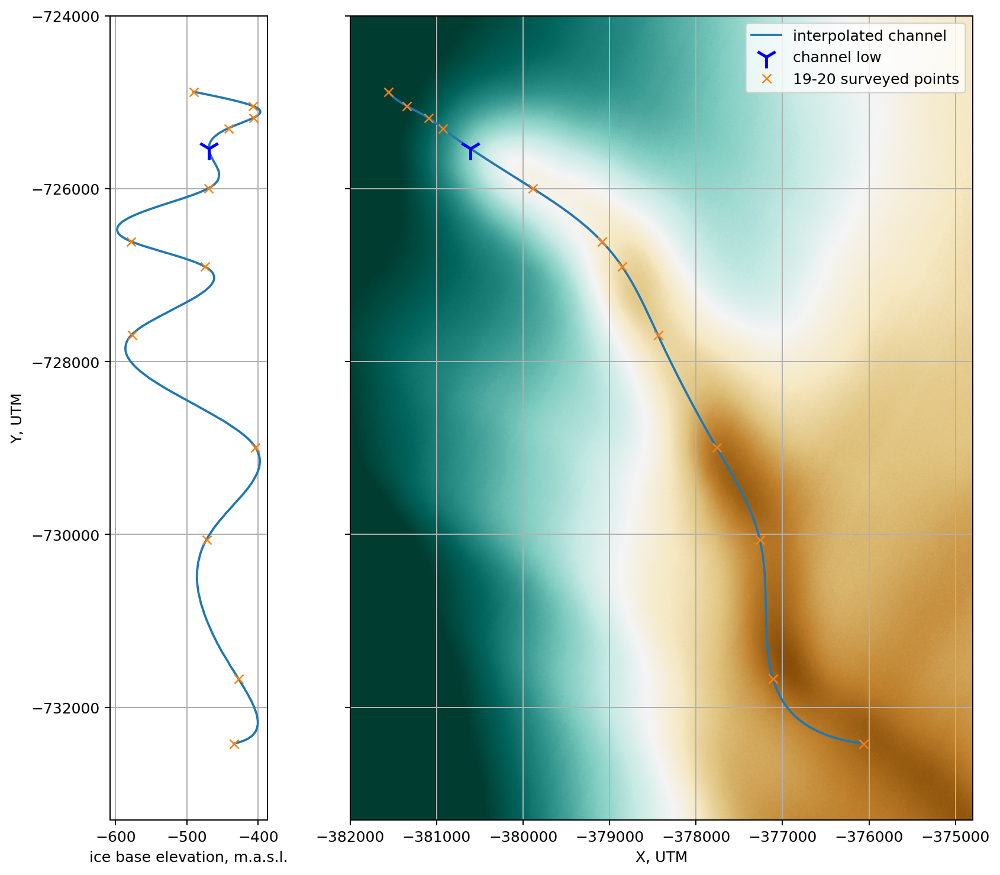

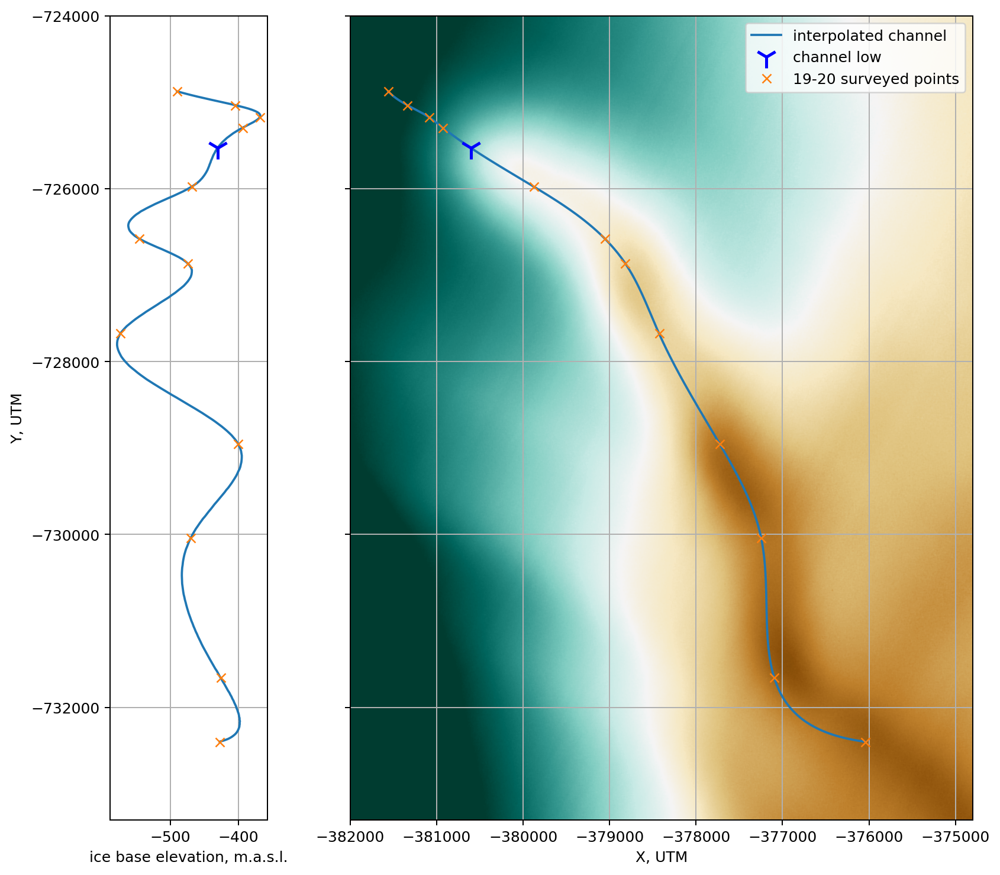

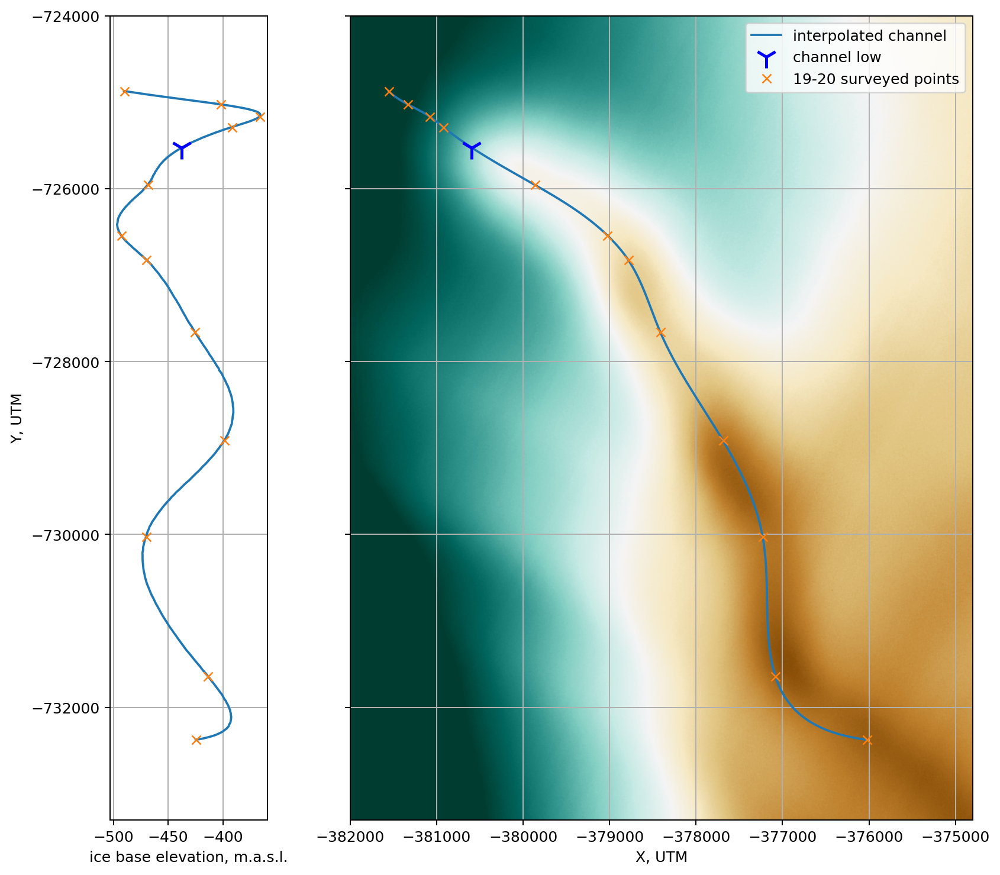

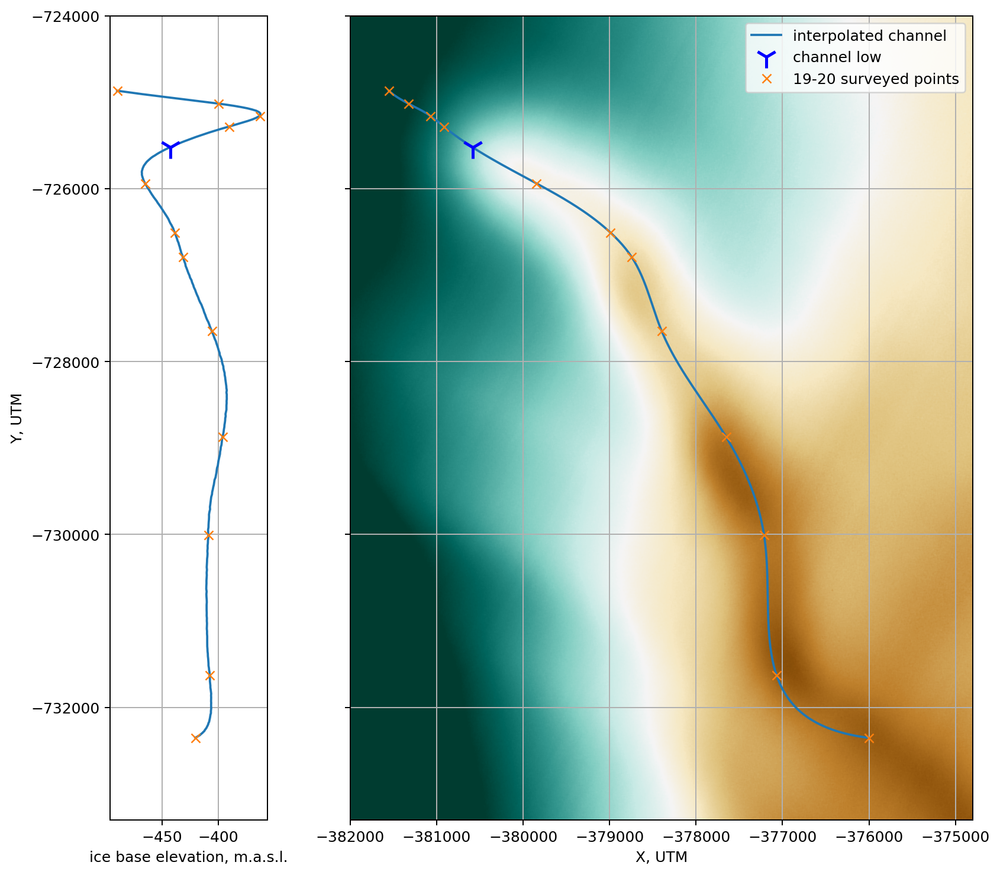

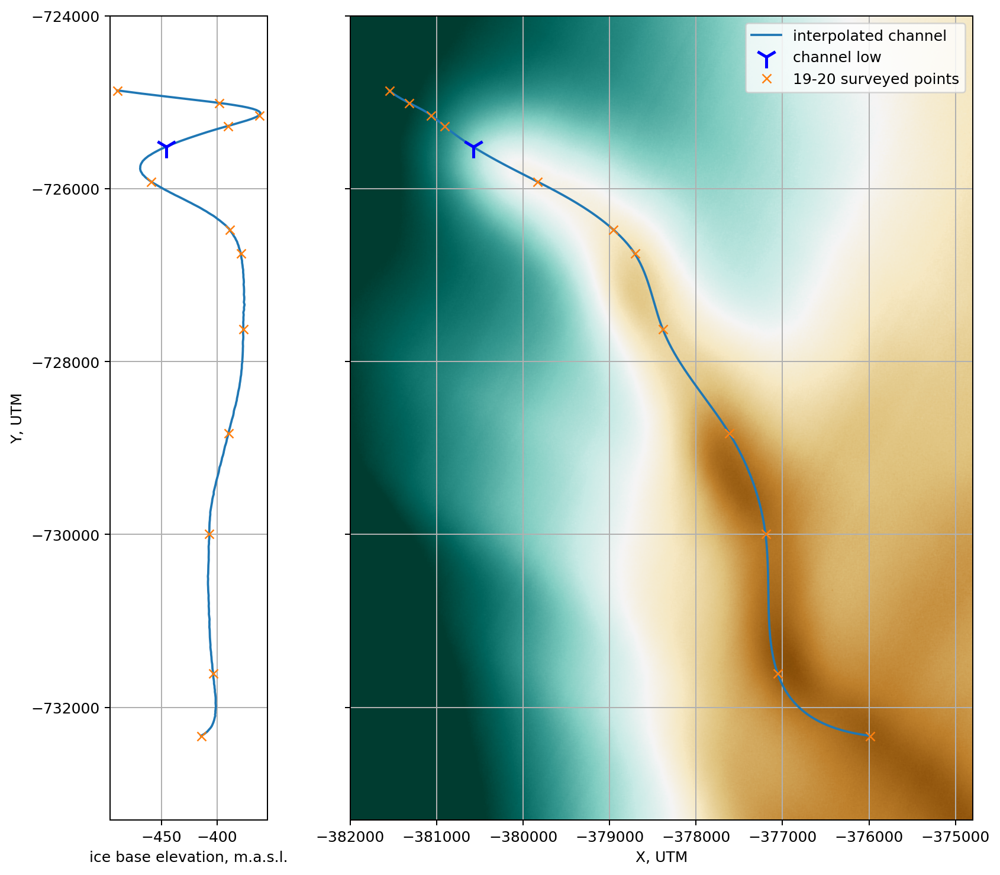

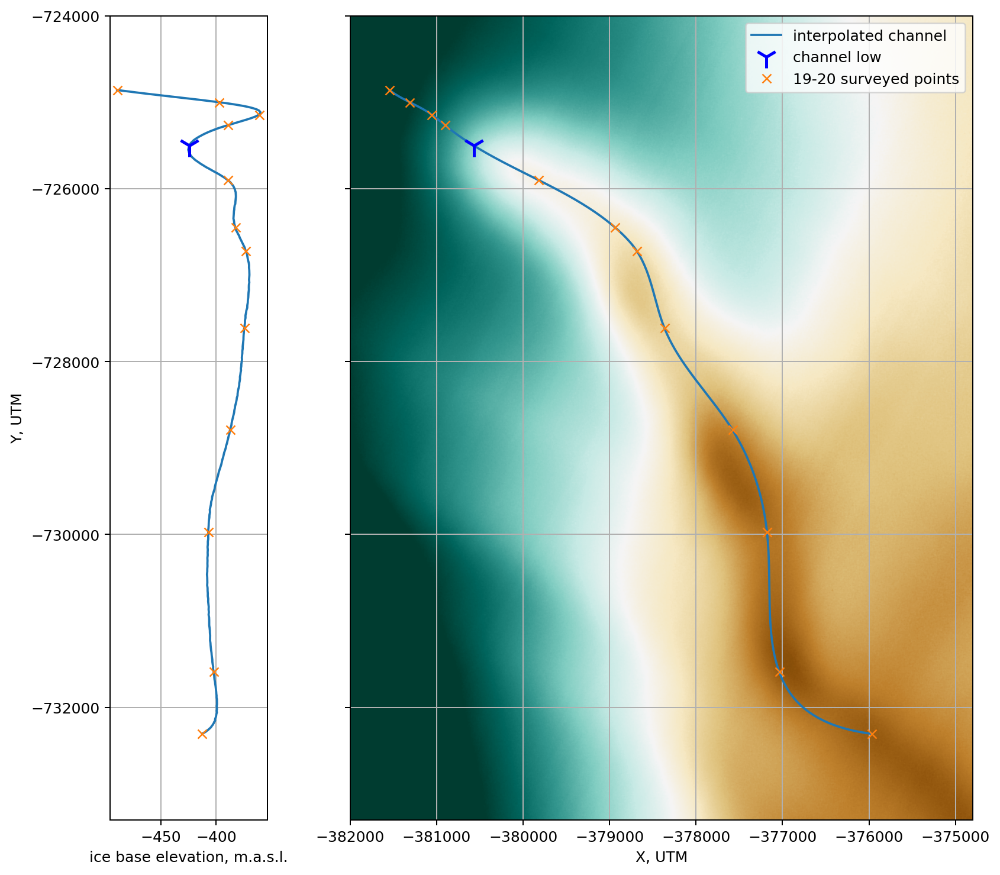

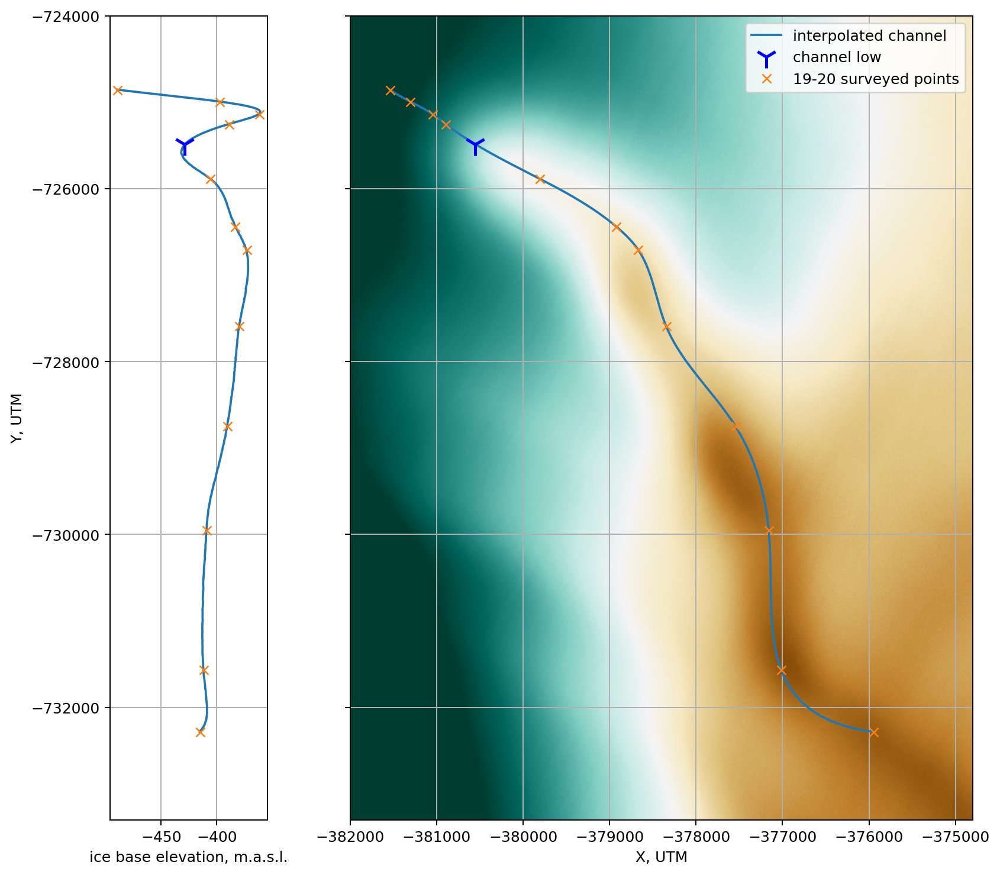

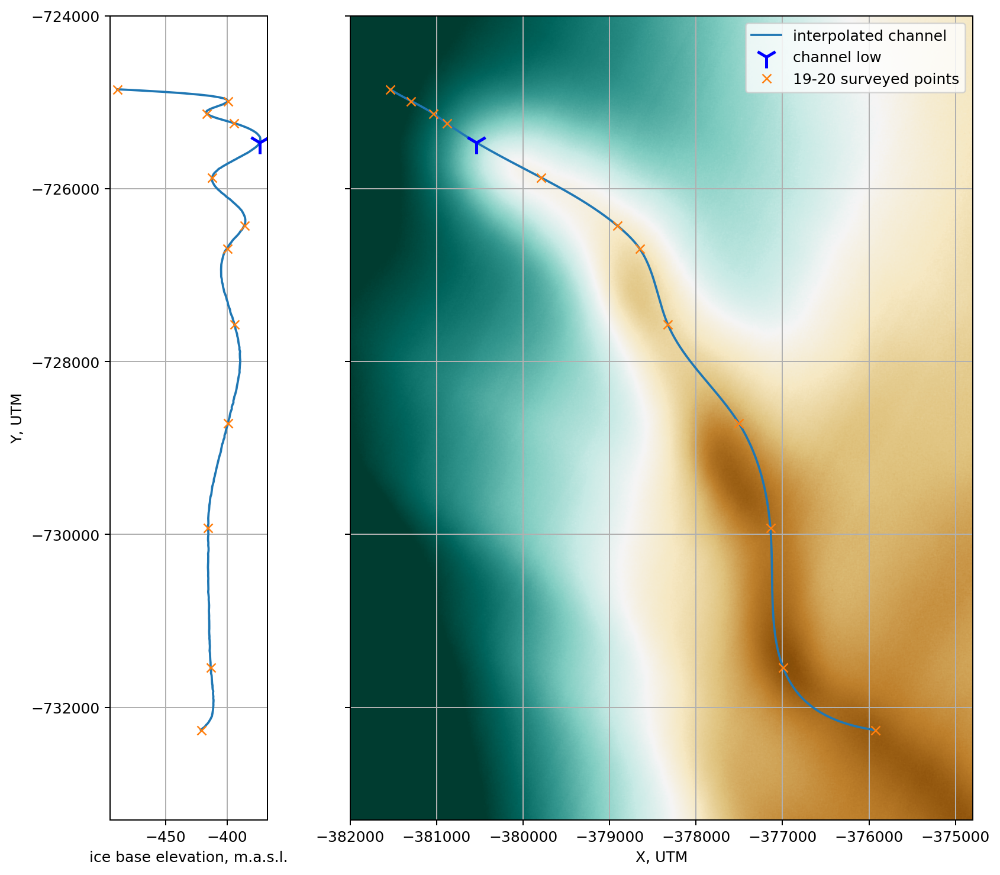

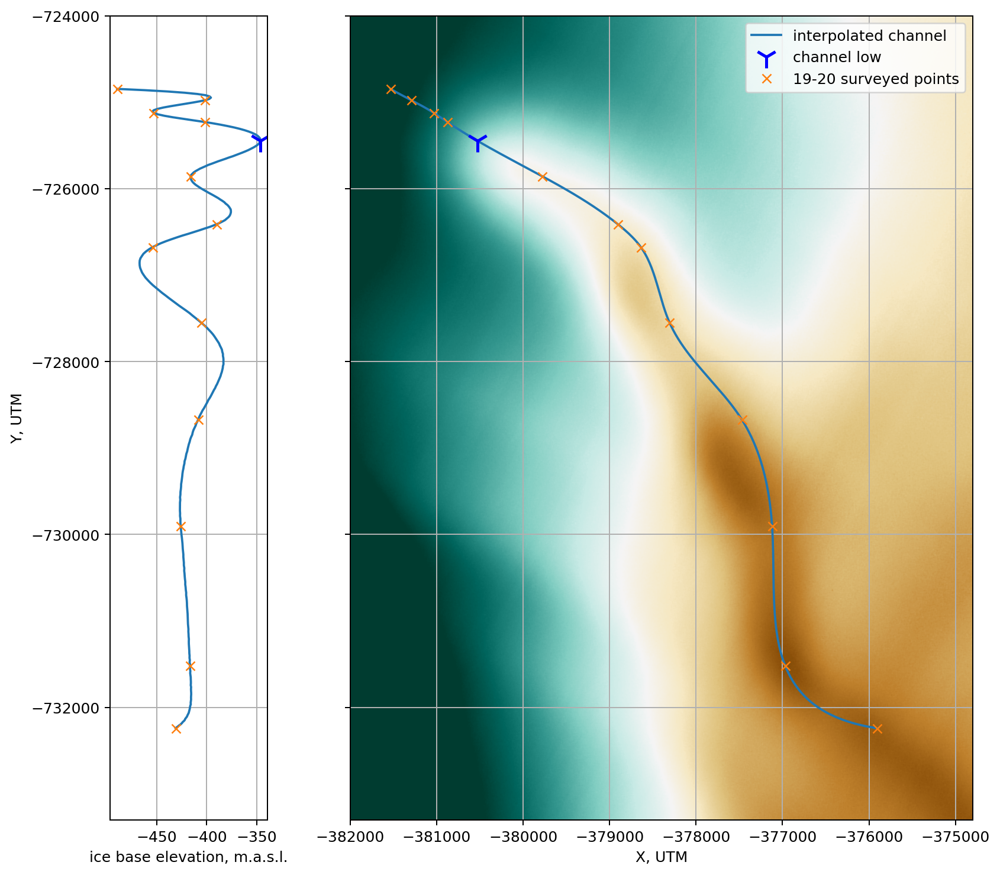

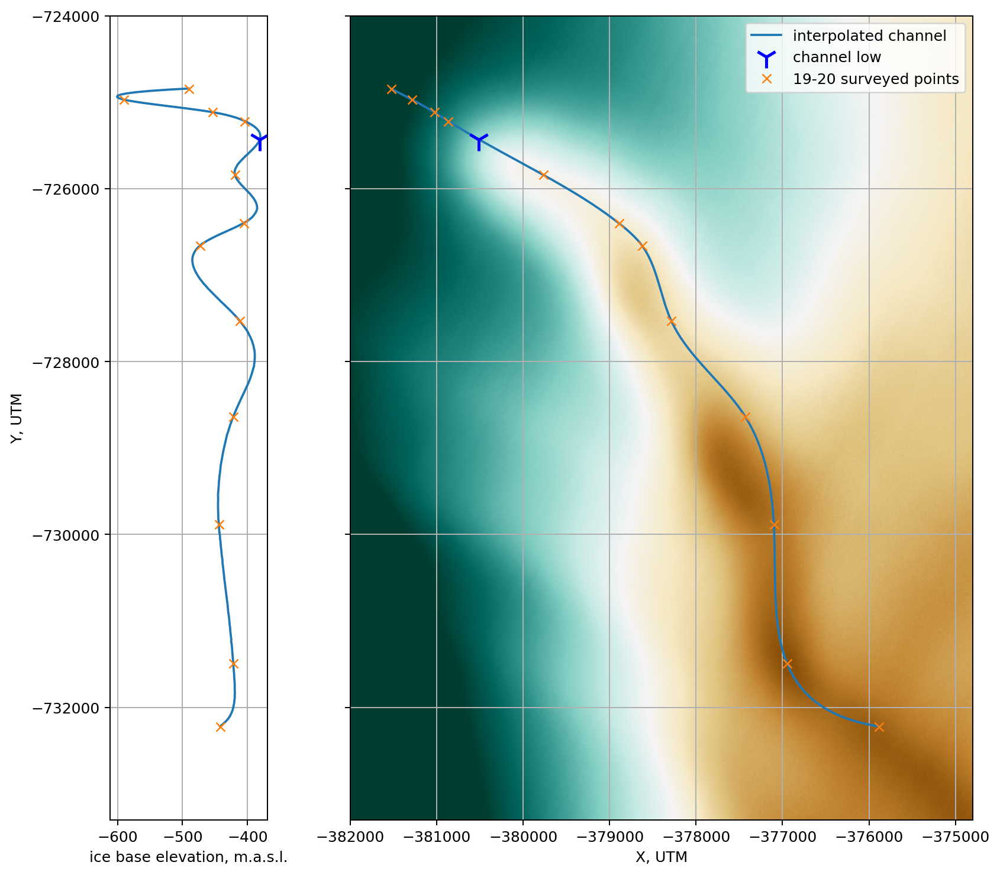

In [25]:
# %matplotlib qt
#  fug, (a0, a1) = plt.subplots(2,1, gridspec_kw = {'height_ratios':[2, 3]},figsize=(6,6),dpi=180)#rema

for mid_at in range(5,15):


    fig, (ax1, ax2) = plt.subplots(1,2, sharey='row',gridspec_kw = {'width_ratios':[1, 4]},
                                   figsize=(10.5,10),dpi=180)#rema ,constrained_layout=True

    ax2.imshow(im_REMA,extent=extent_REMA,vmin=0.2,vmax=0.7, cmap='BrBG')
    ax2.plot(x_new[mid_at,:],y_new[mid_at,:],label='interpolated channel')
    ax2.plot( x_new[mid_at,39],y_new[mid_at,39],'b1',label="channel low",markersize=15,markeredgewidth=2)
    ax2.plot(points_x_surveyed[mid_at,:],points_y_surveyed[mid_at,:],'x',label="19-20 surveyed points")
    ax2.set_xlim([-382000, -374800])
    ax2.set_ylim([-733300,-724000])
    ax2.grid()
    ax2.set_xlabel('X, UTM')
    ax2.legend()
    # plt.contour(xv,yv,surf_out-thickness_interpolated,linewidths=0.75)


    ax1.plot(ib_new[mid_at,:],y_new[mid_at,:])
    ax1.plot(base_surveyed[mid_at,:],points_y_surveyed[mid_at,:],'x',label="19-20 surveyed points")
    ax1.plot( ib_new[mid_at,39],y_new[mid_at,39],'b1',label="channel low",markersize=15,markeredgewidth=2)
    # ax1.set_xlim([400, 480])
    ax1.set_ylim([-733300,-724000])
    ax1.set_ylabel('Y, UTM')
    ax1.set_xlabel('ice base elevation, m.a.s.l.')

    ax1.grid()
    fig.show()

